In [ ]:
from zipfile import ZipFile
file_name= "/content/DataSet ISRO.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
print("done")

done


In [ ]:
from zipfile import ZipFile
file_name= "/content/Launch.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
print("done")

done


In [ ]:
import numpy as np
import os
import cv2
import tensorflow
import pandas as pd
from imutils import paths

In [ ]:
datafilepath= "/content/DataSet ISRO"
epoch= 50

In [ ]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split as tts

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
outputmodel= "/content/output_file/videoclassificationmodel"
outputlabelbinarizer= "/content/output_file/videoclassificationbinarizer"

In [ ]:
missionlabels=set(['Launch','Outdoor Shots','Public shots'])
print("Images is being loaded...")
pathToImages= list(paths.list_images(datafilepath))
data=[]
labels=[]

for images in pathToImages:
  label= images.split(os.path.sep)[-2]
  if label not in missionlabels:
    continue
  image= cv2.imread(images)
  image= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image= cv2.resize(image,(224,224))
  data.append(image)
  labels.append(label)

Images is being loaded...


In [ ]:
print(labels)

['Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public shots', 'Public

In [ ]:
data= np.array(data)
labels= np.array(labels)

lb= LabelBinarizer()
labels= lb.fit_transform(labels)

In [ ]:
(x_train,x_test,y_train,y_test)= tts(data, labels, test_size=0.25, stratify= labels, random_state= 42)

In [ ]:
trainAug= ImageDataGenerator(
    rotation_range= 30,
    zoom_range= 0.15,
    width_shift_range= 0.2,
    height_shift_range= 0.2,
    shear_range= 0.15,
    horizontal_flip= True,
    fill_mode= "nearest"
)

validAug= ImageDataGenerator()
mean= np.array([123.68,116.779,103.939],dtype= "float32")
trainAug.mean= mean
validAug.mean= mean

In [ ]:
from tensorflow import keras as k

In [ ]:
from keras.layers import Input
from keras.layers.pooling import AveragePooling2D
from keras.applications.resnet import ResNet50
from keras.layers.core import Flatten
from keras.layers.core import Dense

from keras.layers.core import Dropout
from keras.models import Model

In [ ]:
baseModel= ResNet50(weights= "imagenet", include_top= False, input_tensor=Input(shape=(224,244,3)))
headModel= baseModel.output
headModel= AveragePooling2D(pool_size=(7,7))(headModel)
headModel= Flatten(name= "flatten")(headModel)
headModel= Dense(512, activation= "relu")(headModel)
headModel= Dropout(0.5)(headModel)
headModel= Dense(len(lb.classes_),activation="softmax")(headModel)
model= Model(inputs= baseModel.inputs, outputs= headModel)
for bml in baseModel.layers:
  bml.trainable= False

94781440/94765736 [==============================] - 1s 0us/step


In [ ]:
from tensorflow.keras.optimizers import SGD

In [ ]:
opt= SGD(lr= 0.0001, momentum= 0.9, decay= 1e-4/epoch)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
model.compile(loss= "categorical_crossentropy", optimizer= opt, metrics= ["accuracy"])

In [ ]:
History= model.fit_generator(
    trainAug.flow(x_train,y_train,batch_size=32),
    steps_per_epoch=len(x_train)//32,
    validation_data=validAug.flow(x_test,y_test),
    validation_steps= len(x_test)//32,
    epochs= epoch)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/50
7/7 [==============================] - 19s 753ms/step - loss: 1.7906 - accuracy: 0.3317 - val_loss: 1.6217 - val_accuracy: 0.2500
Epoch 2/50
7/7 [==============================] - 3s 472ms/step - loss: 1.6886 - accuracy: 0.3317 - val_loss: 1.3990 - val_accuracy: 0.2500
Epoch 3/50
7/7 [==============================] - 3s 466ms/step - loss: 1.4973 - accuracy: 0.4098 - val_loss: 1.2537 - val_accuracy: 0.3281
Epoch 4/50
7/7 [==============================] - 3s 469ms/step - loss: 1.2841 - accuracy: 0.4634 - val_loss: 1.0635 - val_accuracy: 0.4219
Epoch 5/50
7/7 [==============================] - 3s 523ms/step - loss: 1.1617 - accuracy: 0.4976 - val_loss: 0.9208 - val_accuracy: 0.5156
Epoch 6/50
7/7 [==============================] - 3s 534ms/step - loss: 1.0730 - accuracy: 0.5171 - val_loss: 0.8122 - val_accuracy: 0.6406
Epoch 7/50
7/7 [==============================] - 3s 461ms/step - loss: 0.9538 - accuracy: 0.5854 - val_loss: 0.7503 - val_accuracy: 0.7188
Epoch 8/50
7/7 [===

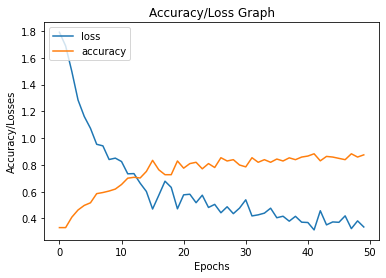

In [ ]:
import matplotlib.pyplot as plt
plt.plot(History.history['loss'])
plt.plot(History.history['accuracy'])
plt.ylabel('Accuracy/Losses')
plt.xlabel('Epochs')
plt.title("Accuracy/Loss Graph")
plt.legend(['loss','accuracy'],loc= 'upper left')
plt.show()

In [ ]:
import pickle

In [ ]:
model.save(outputmodel)
lbinarizer= open("/content/output_file/videoclassificationbinarizer.pickle","wb")
lbinarizer.write(pickle.dumps(lb))
lbinarizer.close()

INFO:tensorflow:Assets written to: /content/output_file/videoclassificationmodel/assets


In [ ]:
from keras.models import load_model
from collections import deque
from google.colab.patches import cv2_imshow

In [ ]:
model= load_model("/content/output_file/videoclassificationmodel")
lb= pickle.loads(open("/content/output_file/videoclassificationbinarizer.pickle","rb").read())
outputvideo= "/content/output_file/test_output.avi"
mean= np.array([123.68,116.779,103.939][::1],dtype="float32")
Queue= deque(maxlen=128)

In [ ]:
print(lb.classes_)

['Launch' 'Outdoor Shots' 'Public shots']


In [ ]:
missionlist=['Launch','Outdoor Shots','Public shots']

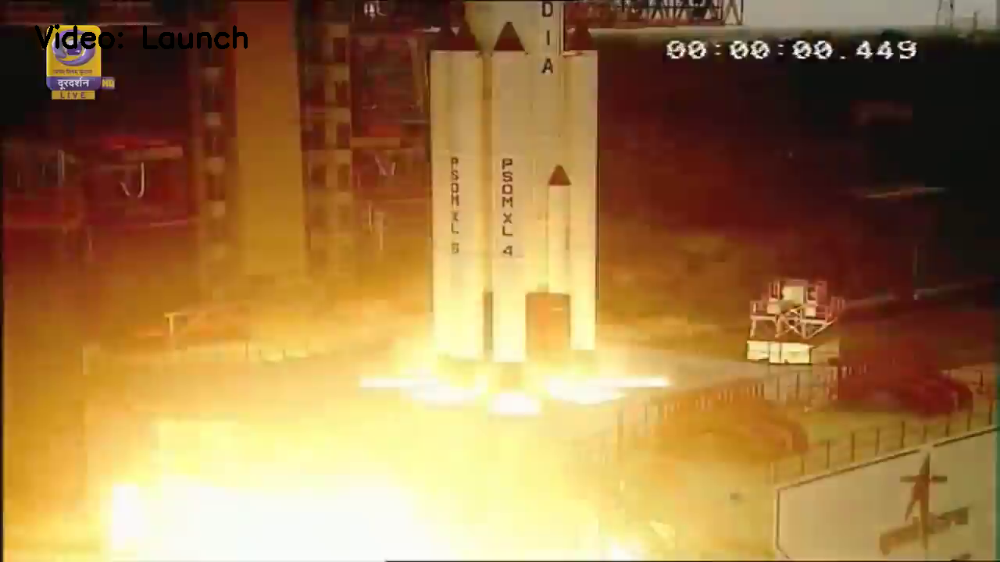

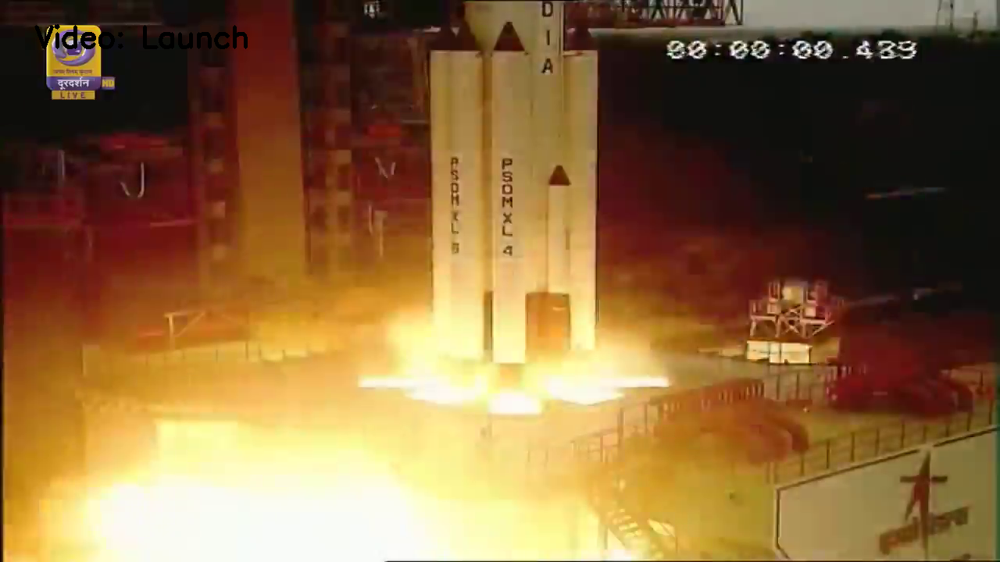

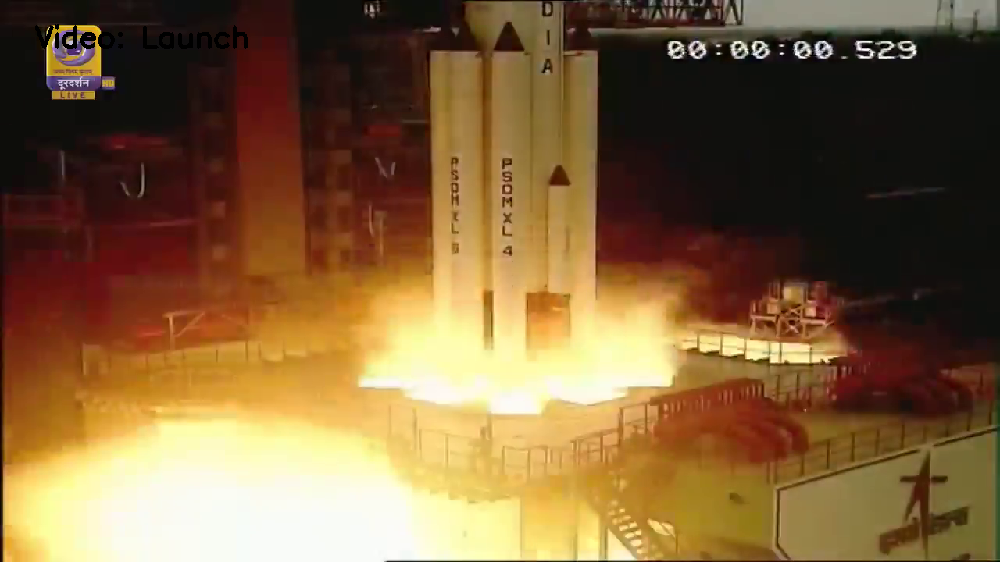

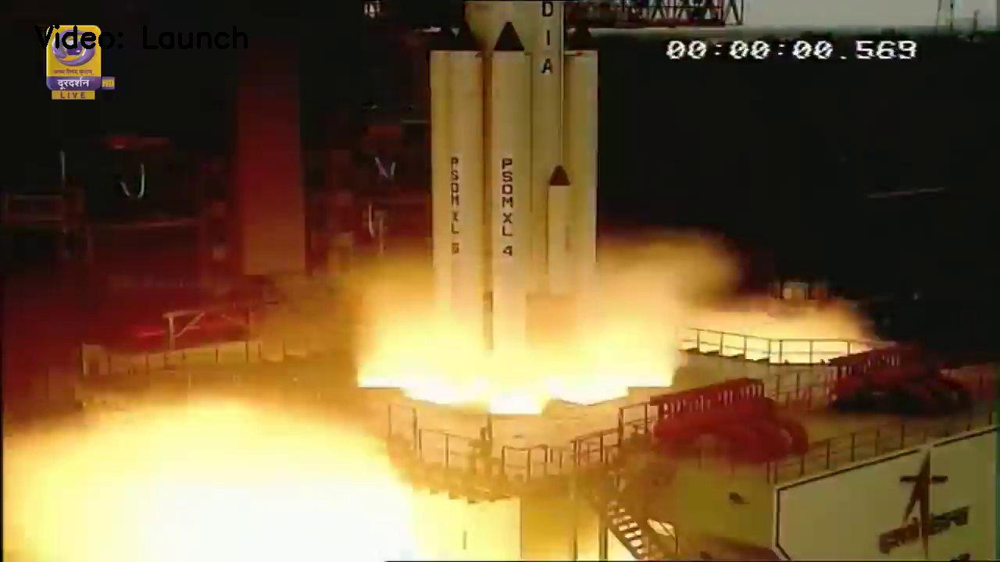

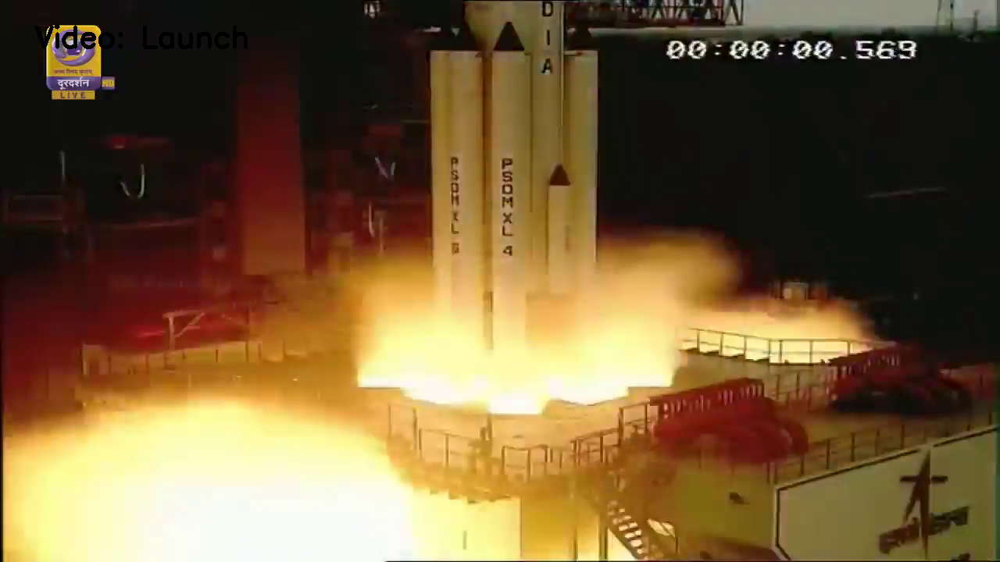

...

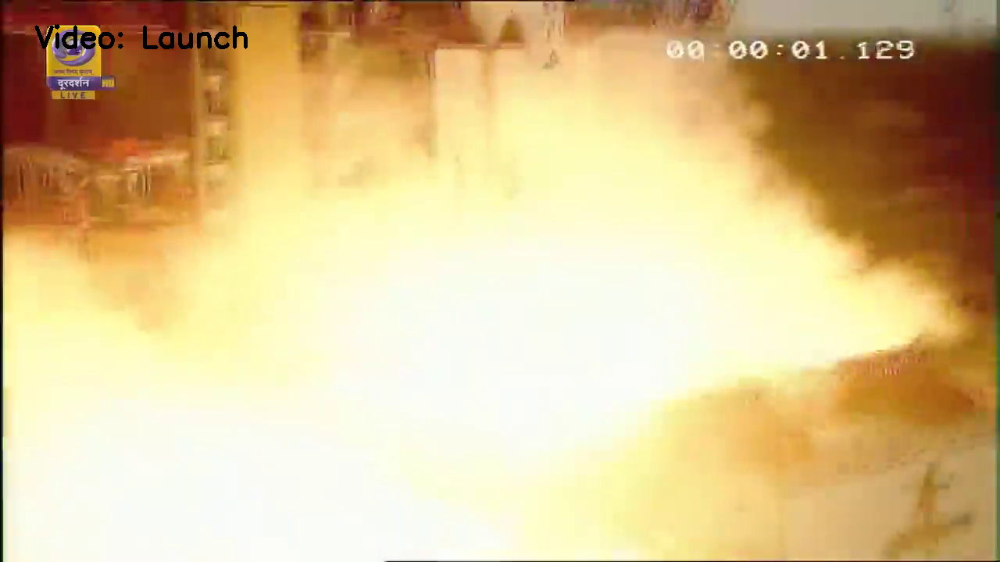

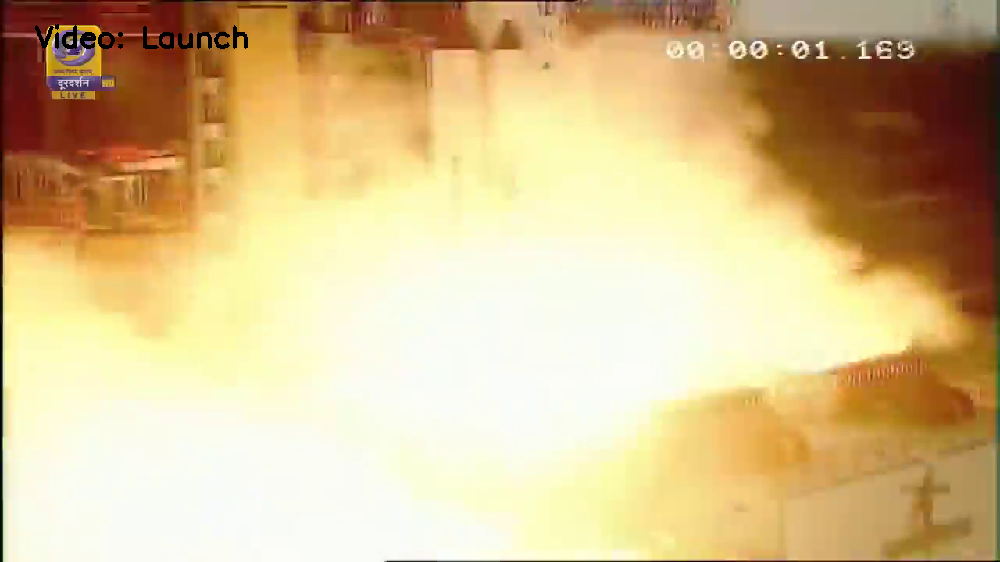

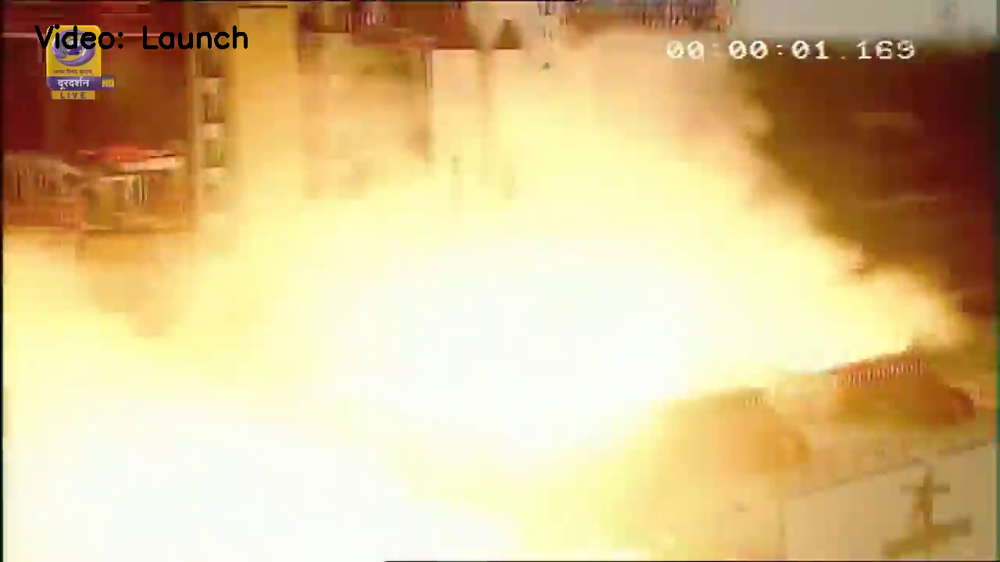

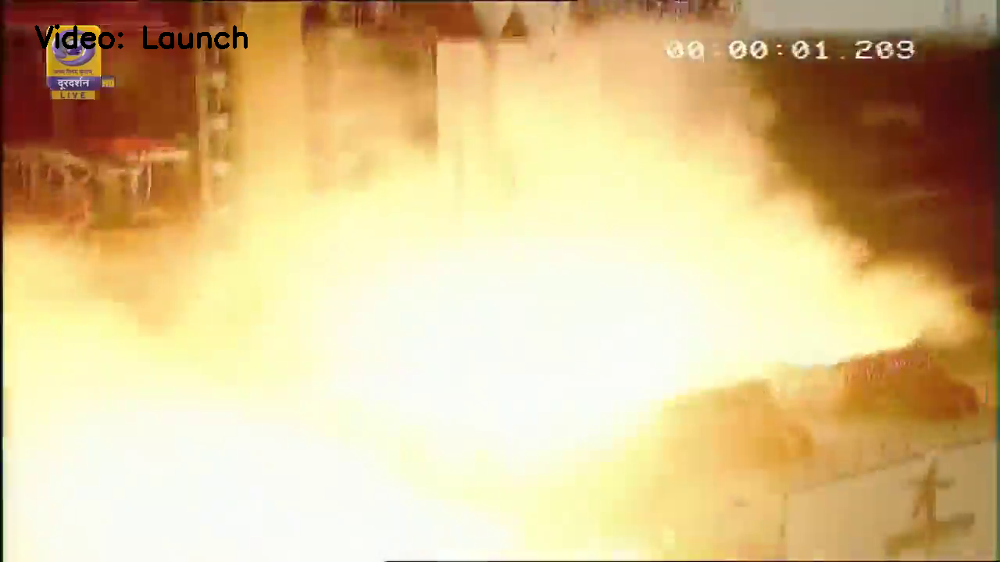

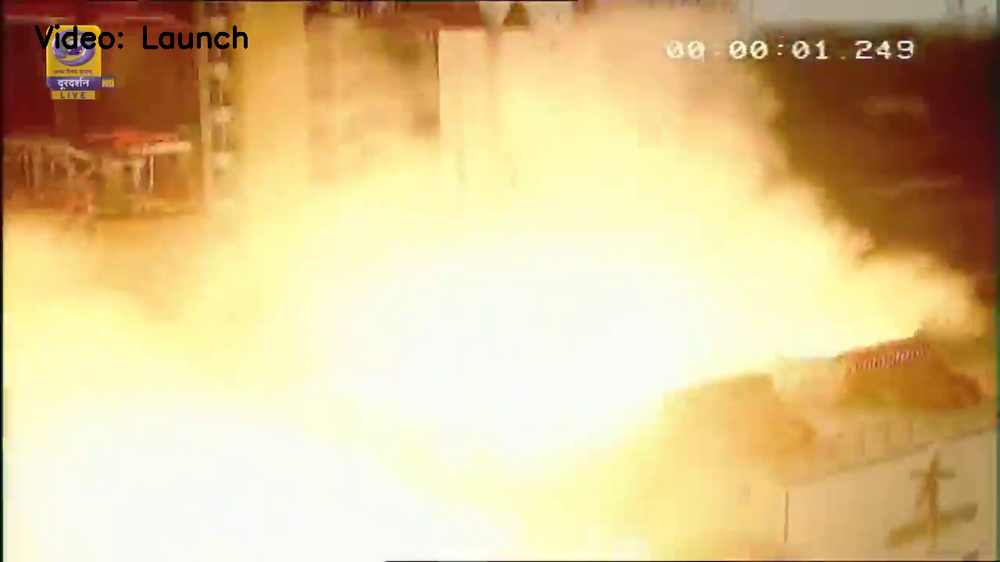

In [ ]:
capture_video= cv2.VideoCapture("/content/test_file/Launch.mp4")
writer= None
(Width, Height)= (None,None)

while True:
  (taken,frame)= capture_video.read()
  if not taken:
    break
  if Width is None or Height is None:
    (Width,Height)= frame.shape[:2]
  output= frame.copy()
  frame= cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
  frame= cv2.resize(frame, (244,224)).astype("float32")
  frame-= mean
  preds= model.predict(np.expand_dims(frame,axis=0))[0]
  Queue.append(preds)
  results= np.array(Queue).mean(axis= 0)
  i= np.argmax(results)
  label= missionlist[i]
  text= "Video: {}".format(label)
  cv2.putText(output,text, (45,60),cv2.FONT_HERSHEY_SIMPLEX,1.25,(0,0,0),thickness= 3)

  if writer is None:
    fourcc= cv2.VideoWriter_fourcc(*"MJPG")
    writer= cv2.VideoWriter(outputvideo,fourcc,30,(Width, Height),True)
    
  writer.write(output)
  cv2_imshow(output)
  key= cv2.waitKey(1)& 0xFF

  if key== ord("q"):
    break

print("Finalizing...")
writer.release()
capture_video.release()